In [3]:
import pandas as pd
df=pd.read_csv("D:/23A55A4405/innomatics/project 2/dataset.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [4]:
col_names=[ col.strip().lower().replace(' ','_') for col in df.columns ]
df.columns=col_names
df.columns

Index(['vin_(1-10)', 'county', 'city', 'state', 'postal_code', 'model_year',
       'make', 'model', 'electric_vehicle_type',
       'clean_alternative_fuel_vehicle_(cafv)_eligibility', 'electric_range',
       'base_msrp', 'legislative_district', 'dol_vehicle_id',
       'vehicle_location', 'electric_utility', '2020_census_tract'],
      dtype='object')

In [5]:
df = df.rename(columns={'vin_(1-10)': 'vin','clean_alternative_fuel_vehicle_(cafv)_eligibility':'cafv_eligibility','electric_vehicle_type':'ev_type'})

In [6]:
df.shape

(112634, 17)

In [7]:
missing_values = df.isnull().sum()
missing_values[missing_values > 0]

model                    20
legislative_district    286
vehicle_location         24
electric_utility        443
dtype: int64

<!-- it's fine to delete rows with missing values, since:
->The number of missing values is small compared to the overall dataset.
->The missing data does not represent a crucial part of our analysis.
->Removing them won't significantly bias our results. -->

In [8]:
# df.dropna(subset=['model', 'legislative_district', 'vehicle_location', 'electric_utility'], inplace=True)

In [9]:
# missing_values = df.isnull().sum()
# missing_values[missing_values > 0]

In [10]:
df['ev_type'] = df['ev_type'].replace({
    'Battery Electric Vehicle (BEV)': 'bev',
    'Plug-in Hybrid Electric Vehicle (PHEV)': 'phev'
})
df['ev_type'].value_counts()

ev_type
bev     86044
phev    26590
Name: count, dtype: int64

In [11]:
categorical_df=df[['county','city','state','make','model','cafv_eligibility','ev_type','electric_utility']]
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   county            112634 non-null  object
 1   city              112634 non-null  object
 2   state             112634 non-null  object
 3   make              112634 non-null  object
 4   model             112614 non-null  object
 5   cafv_eligibility  112634 non-null  object
 6   ev_type           112634 non-null  object
 7   electric_utility  112191 non-null  object
dtypes: object(8)
memory usage: 6.9+ MB


In [12]:
import numpy as np
df['legislative_district'] = df['legislative_district'].fillna(0).astype(np.int64)

df['legislative_district'] = df['legislative_district'].astype(np.int64)
numerical_df=df.select_dtypes(include=['int64'])
numerical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   postal_code           112634 non-null  int64
 1   model_year            112634 non-null  int64
 2   electric_range        112634 non-null  int64
 3   base_msrp             112634 non-null  int64
 4   legislative_district  112634 non-null  int64
 5   dol_vehicle_id        112634 non-null  int64
 6   2020_census_tract     112634 non-null  int64
dtypes: int64(7)
memory usage: 6.0 MB


In [11]:
def categorical_univariate_analysis(categorical):
    for i in categorical:
        print("-"*10,i,"-"*10)
        print(categorical[i].agg(['count','nunique']))
        print("value counts:\n",categorical[i].value_counts())
        print()


def numerical_univariate_analysis(numerical_data):
    for i in numerical_data:
        print("-"*10,i,"-"*10)
        print(numerical_data[i].agg(['min','max','mean','median','std','skew','kurt']))
        print()


numerical_univariate_analysis(numerical_df)
categorical_univariate_analysis(categorical_df)

---------- postal_code ----------
min        1730.000000
max       99701.000000
mean      98156.226850
median    98119.000000
std        2648.733064
skew        -27.955285
kurt        820.874840
Name: postal_code, dtype: float64

---------- model_year ----------
min       1997.000000
max       2023.000000
mean      2019.003365
median    2020.000000
std          2.892364
skew        -0.817579
kurt        -0.001160
Name: model_year, dtype: float64

---------- electric_range ----------
min         0.000000
max       337.000000
mean       87.812987
median     32.000000
std       102.334216
skew        0.817103
kurt       -0.876312
Name: electric_range, dtype: float64

---------- base_msrp ----------
min            0.000000
max       845000.000000
mean        1793.439681
median         0.000000
std        10783.753486
skew          10.100497
kurt         371.695682
Name: base_msrp, dtype: float64

---------- legislative_district ----------
min        0.000000
max       49.000000
mean      2

C:\Users\vaddi\AppData\Local\Temp\ipykernel_20280\3785874761.py:27: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




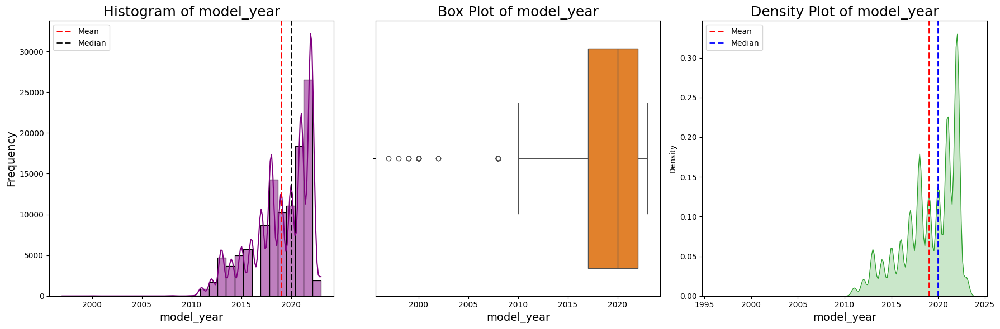

C:\Users\vaddi\AppData\Local\Temp\ipykernel_20280\3785874761.py:27: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




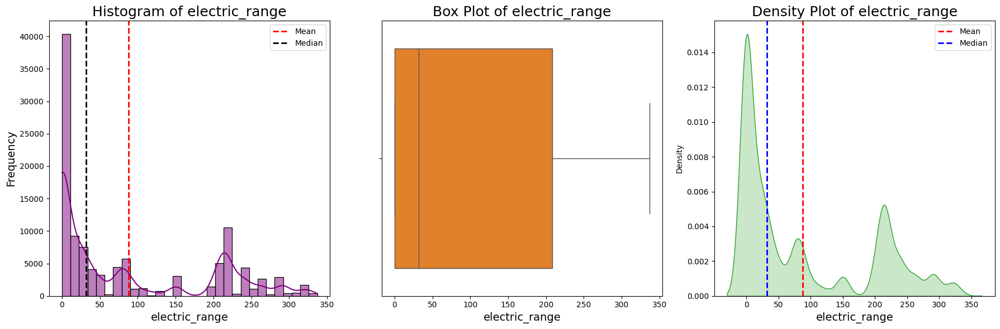

C:\Users\vaddi\AppData\Local\Temp\ipykernel_20280\3785874761.py:27: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




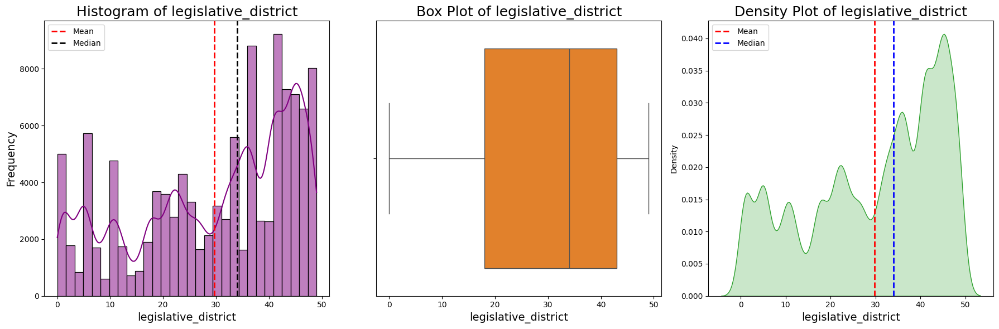

C:\Users\vaddi\AppData\Local\Temp\ipykernel_20280\3785874761.py:27: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




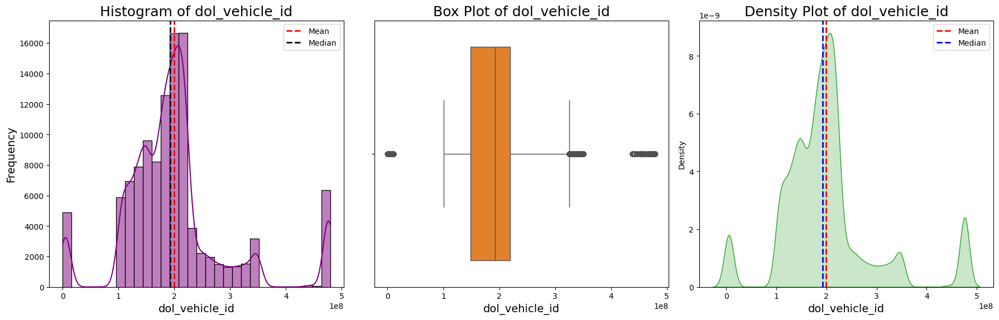

C:\Users\vaddi\AppData\Local\Temp\ipykernel_20280\3785874761.py:27: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




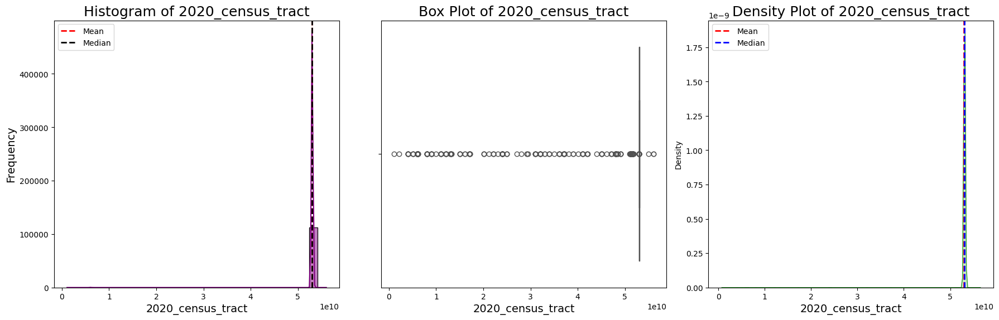

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

def univariate_analysis_plots(numerical_data):
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Define unique colors for the plots
    
    for column in numerical_data.columns:
        plt.figure(figsize=(18, 6))

        # Histogram
        plt.subplot(1, 3, 1)
        sns.histplot(numerical_data[column], kde=True, bins=30, color='purple')
        plt.title(f'Histogram of {column}', fontsize=18)
        plt.xlabel(column, fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.axvline(numerical_data[column].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
        plt.axvline(numerical_data[column].median(), color='black', linestyle='dashed', linewidth=2, label='Median')
        plt.legend()
        
        plt.subplot(1, 3, 2)
        sns.boxplot(x=numerical_data[column], color=colors[1])
        plt.title(f'Box Plot of {column}', fontsize=18)
        plt.xlabel(column, fontsize=14)
        

        plt.subplot(1, 3, 3)
        sns.kdeplot(numerical_data[column], shade=True, color=colors[2])
        plt.title(f'Density Plot of {column}', fontsize=18)
        plt.xlabel(column, fontsize=14)
        mean_value = numerical_data[column].mean()
        median_value = numerical_data[column].median()
        
        plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label='Mean')
        plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=2, label='Median')
        
        plt.legend()
        plt.tight_layout()
        plt.show()

numerical_columns = [
    # 'postal_code', 
    'model_year', 
    'electric_range', 
    # 'base_msrp', 
    'legislative_district', 
    'dol_vehicle_id', 
    '2020_census_tract'
]

numerical_data = df[numerical_columns]
univariate_analysis_plots(numerical_data)


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\2933055932.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sorted_make.index, y=sorted_make.values, palette='Set2')


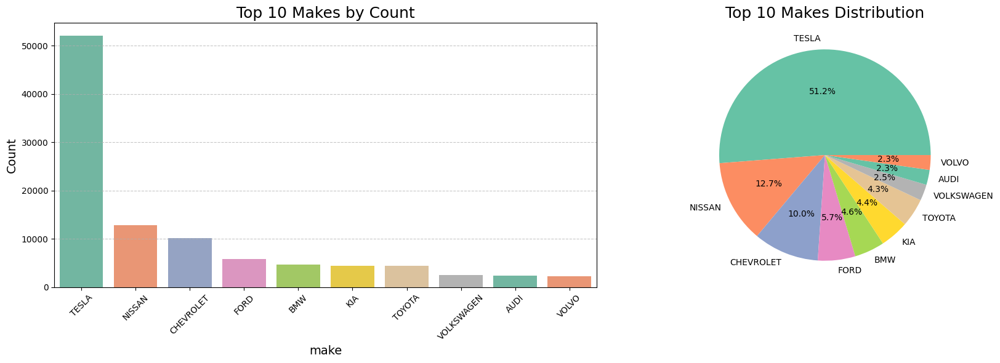

In [13]:

make_column = 'make'

plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)

sorted_make = categorical_df[make_column].value_counts().nlargest(10)
sns.barplot(x=sorted_make.index, y=sorted_make.values, palette='Set2')
plt.title(f'Top 10 Makes by Count', fontsize=18)
plt.xlabel(make_column, fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(1, 2,2)
sizes_make = categorical_df[make_column].value_counts().nlargest(10)
plt.pie(sizes_make, labels=sizes_make.index, autopct='%1.1f%%', colors=sns.color_palette("Set2", n_colors=len(sizes_make)))
plt.title(f'Top 10 Makes Distribution', fontsize=18)

plt.tight_layout()
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\1356041152.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sorted_county.index, y=sorted_county.values, palette='Set2')


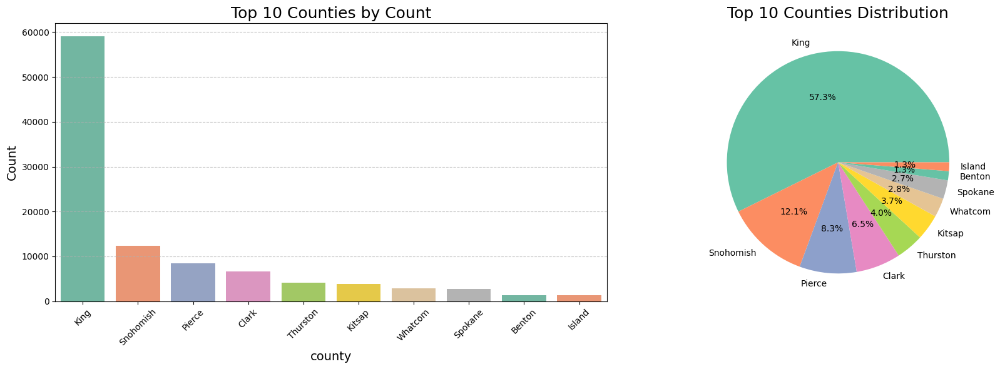

In [14]:
county_column = 'county'
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)

sorted_county = categorical_df[county_column].value_counts().nlargest(10)
sns.barplot(x=sorted_county.index, y=sorted_county.values, palette='Set2')
plt.title(f'Top 10 Counties by Count', fontsize=18)
plt.xlabel(county_column, fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(1,2,2)
sizes = categorical_df[county_column].value_counts().nlargest(10)
plt.pie(sizes, labels=sizes.index, autopct='%1.1f%%', colors=sns.color_palette("Set2", n_colors=len(sizes)))
plt.title(f'Top 10 Counties Distribution', fontsize=18)

plt.tight_layout()
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\398090461.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sorted_county.index, y=sorted_county.values, palette='Set3')


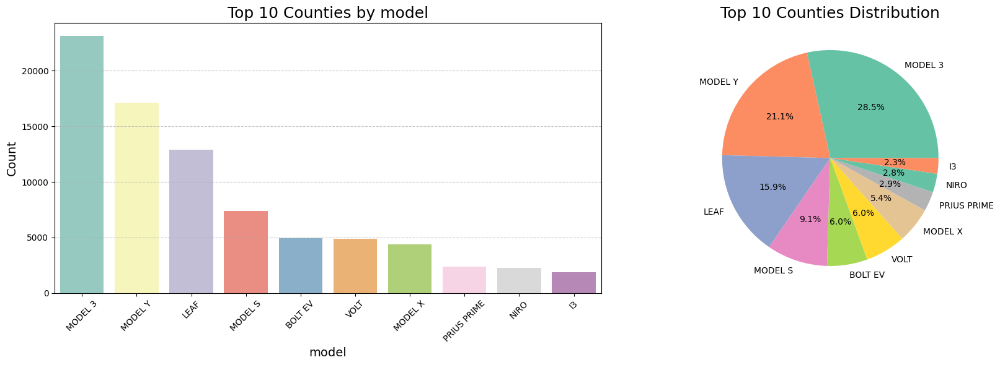

In [15]:

county_column = 'model'

plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)

sorted_county = categorical_df[county_column].value_counts().nlargest(10)
sns.barplot(x=sorted_county.index, y=sorted_county.values, palette='Set3')
plt.title(f'Top 10 Counties by model', fontsize=18)
plt.xlabel(county_column, fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sizes = categorical_df[county_column].value_counts().nlargest(10)
plt.pie(sizes, labels=sizes.index, autopct='%1.1f%%', colors=sns.color_palette("Set2", n_colors=len(sizes)))
plt.title(f'Top 10 Counties Distribution', fontsize=18)

plt.tight_layout()
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\839408175.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='cafv_eligibility', palette='Set2')


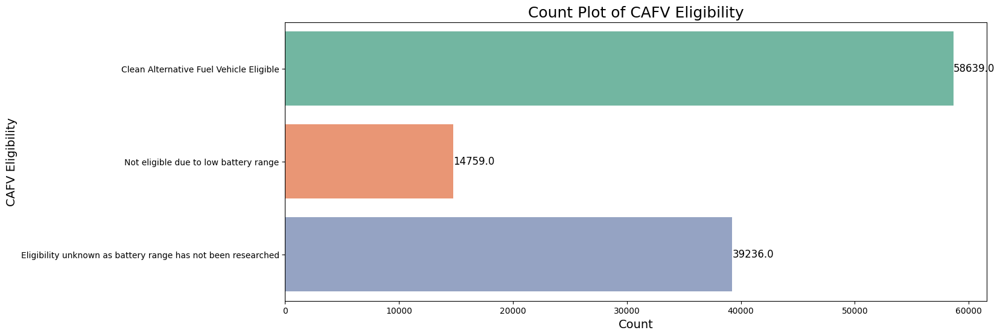

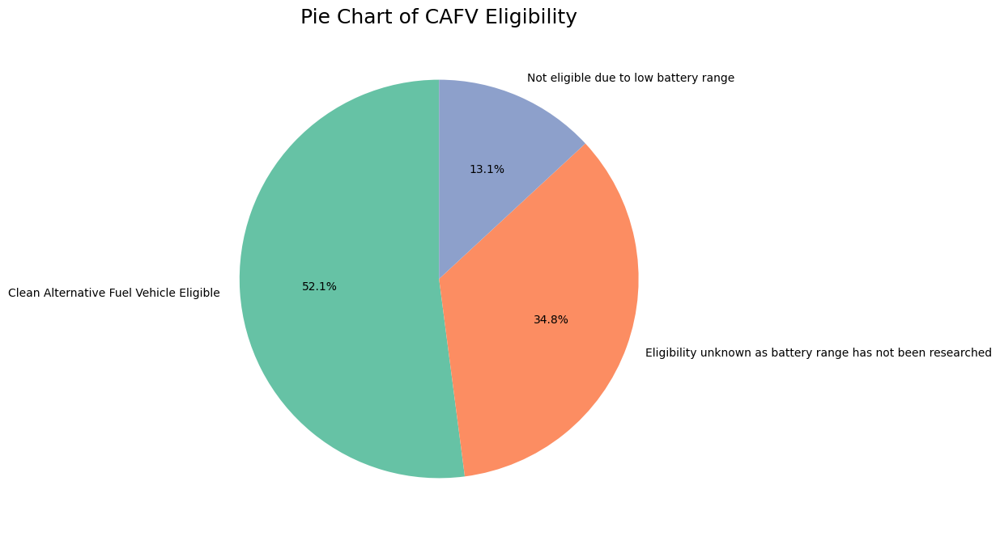

In [16]:
plt.figure(figsize=(15, 6))

sns.countplot(data=df, y='cafv_eligibility', palette='Set2')
plt.title('Count Plot of CAFV Eligibility', fontsize=18)
plt.xlabel('Count', fontsize=14)
plt.ylabel('CAFV Eligibility', fontsize=14)
for p in plt.gca().patches:
    plt.annotate(f'{p.get_width()}', (p.get_width(), p.get_y() + p.get_height() / 2.),
                 ha='left', va='center', fontsize=12, color='black')
plt.show()

counts = df['cafv_eligibility'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2'))
plt.title('Pie Chart of CAFV Eligibility', fontsize=18)
plt.show()

C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\3888213473.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='ev_type', palette='Set1')


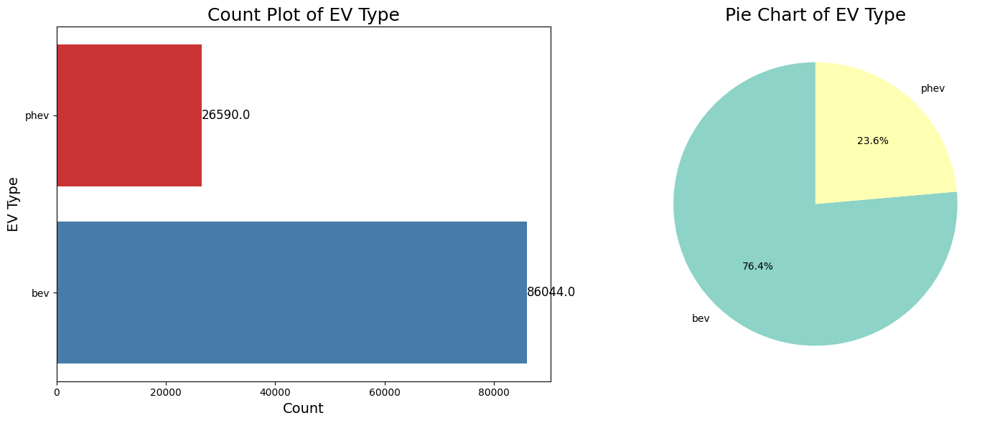

In [17]:

plt.figure(figsize=(15, 6))

# Count Plot
plt.subplot(1, 2, 1)
sns.countplot(data=df, y='ev_type', palette='Set1')
plt.title('Count Plot of EV Type', fontsize=18)
plt.xlabel('Count', fontsize=14)
plt.ylabel('EV Type', fontsize=14)
for p in plt.gca().patches:
    plt.annotate(f'{p.get_width()}', (p.get_width(), p.get_y() + p.get_height() / 2.),
                 ha='left', va='center', fontsize=12, color='black')

# Pie Chart
plt.subplot(1,2,2)
counts = df['ev_type'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3'))
plt.title('Pie Chart of EV Type', fontsize=18)

plt.tight_layout()
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\3543785380.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=sorted_county.index, x=sorted_county.values, palette='Set1')


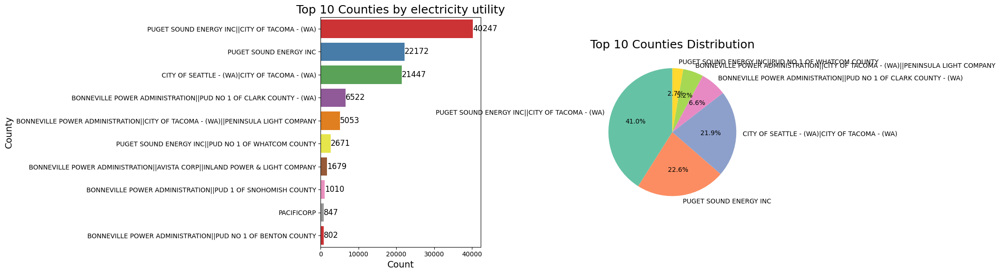

In [18]:
county_column = 'electric_utility'

plt.figure(figsize=(20, 6))

plt.subplot(1, 2, 1)
sorted_county = categorical_df[county_column].value_counts().nlargest(10)
sns.barplot(y=sorted_county.index, x=sorted_county.values, palette='Set1')
plt.title(f'Top 10 Counties by electricity utility', fontsize=18)
plt.xlabel('Count', fontsize=14)
plt.ylabel('County', fontsize=14)

for index, value in enumerate(sorted_county.values):
    plt.text(value, index, str(value), va='center', fontsize=12, color='black')

plt.subplot(1, 2, 2)
sizes = categorical_df[county_column].value_counts().nlargest(6)
plt.pie(sizes, labels=sizes.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2'))
plt.title(f'Top 10 Counties Distribution', fontsize=18)

plt.tight_layout()
plt.show()


In [19]:
crosstab_ev_cafv = pd.crosstab(df['ev_type'], df['cafv_eligibility'])
print("Crosstab between Electric Vehicle Type and CAFV Eligibility:")
crosstab_ev_cafv

Crosstab between Electric Vehicle Type and CAFV Eligibility:


cafv_eligibility,Clean Alternative Fuel Vehicle Eligible,Eligibility unknown as battery range has not been researched,Not eligible due to low battery range
ev_type,,,
bev,46799,39236,9
phev,11840,0,14750


In [20]:
crosstab_year_ev_type = pd.crosstab(df['model_year'], df['ev_type'])
print("\nCrosstab between Model Year and Electric Vehicle Type:")
crosstab_year_ev_type



Crosstab between Model Year and Electric Vehicle Type:


ev_type,bev,phev
model_year,,
1997,1,0
1998,1,0
1999,3,0
2000,10,0
2002,2,0
2008,23,0
2010,24,0
2011,769,71
2012,814,891


In [21]:
df.columns

Index(['vin', 'county', 'city', 'state', 'postal_code', 'model_year', 'make',
       'model', 'ev_type', 'cafv_eligibility', 'electric_range', 'base_msrp',
       'legislative_district', 'dol_vehicle_id', 'vehicle_location',
       'electric_utility', '2020_census_tract'],
      dtype='object')

In [22]:
summary_stats = df[['electric_range', 'base_msrp']].describe()
print("\nSummary Statistics for Electric Range and Base MSRP:")
summary_stats


Summary Statistics for Electric Range and Base MSRP:


,electric_range,base_msrp
count,112634.000000,112634.000000
mean,87.812987,1793.439681
std,102.334216,10783.753486
min,0.000000,0.000000
25%,0.000000,0.000000
50%,32.000000,0.000000
75%,208.000000,0.000000
max,337.000000,845000.000000


In [23]:
skewness_range = df['electric_range'].skew()
skewness_msrp = df['base_msrp'].skew()

print("\nSkewness of Electric Range:", skewness_range)
print("Skewness of Base MSRP:", skewness_msrp)



Skewness of Electric Range: 0.8171032263518314
Skewness of Base MSRP: 10.100497243522174


In [24]:
print("\nKey Insights:")
print("1. The correlation between Electric Range and Base MSRP is low.")
print("2. BEVs have a much higher average electric range than PHEVs.")
print("3. Crosstabulation shows trends in vehicle types and CAFV eligibility.")
print("4. Electric Range and Base MSRP distributions are skewed, suggesting the need for transformations if used in regression models.")


Key Insights:
1. The correlation between Electric Range and Base MSRP is low.
2. BEVs have a much higher average electric range than PHEVs.
3. Crosstabulation shows trends in vehicle types and CAFV eligibility.
4. Electric Range and Base MSRP distributions are skewed, suggesting the need for transformations if used in regression models.


In [25]:
def calculate_range(x):
    return x.max() - x.min()

# Group by Electric Vehicle Type and calculate the range for Electric Range and Base MSRP
ev_type_range = df.groupby('ev_type')[['electric_range', 'base_msrp']].apply(lambda x: calculate_range(x))
print("\nGroupby Electric Vehicle Type (Range for Electric Range and Base MSRP):")
ev_type_range



Groupby Electric Vehicle Type (Range for Electric Range and Base MSRP):


,electric_range,base_msrp
ev_type,,
bev,337,110950
phev,147,845000


In [26]:
# Group by Electric Vehicle Type and Model Year, and calculate the mean and std for Electric Range and Base MSRP
ev_type_year_grouped = df.groupby(['ev_type', 'model_year'])[['electric_range', 'base_msrp']].agg(['mean', 'std'])
print("\nGroupby Electric Vehicle Type and Model Year (Mean, Std for Electric Range and Base MSRP):")
ev_type_year_grouped


Groupby Electric Vehicle Type and Model Year (Mean, Std for Electric Range and Base MSRP):


electric_range                 base_msrp              
                             mean        std           mean           std
ev_type model_year                                                       
bev     1997            39.000000        NaN       0.000000           NaN
        1998            58.000000        NaN       0.000000           NaN
        1999            74.000000   0.000000       0.000000      0.000000
        2000            58.000000   0.000000       0.000000      0.000000
        2002            95.000000   0.000000       0.000000      0.000000
        2008           220.000000   0.000000   98950.000000      0.000000
        2010           245.000000   0.000000  110950.000000      0.000000
        2011            74.582575  16.476981     992.197659  10358.794647
        2012           104.400491  71.465622    9860.687961  22226.762179
        2013           111.457256  58.773062   18853.081511  31027.579744
        2014           128.285408  60.911735   25612.500000  33688.610208
        2015           121.039448  57.044131       0.000000      0.000000
        2016           135.302946  59.868728    3302.094972   9727.390766
        2017           179.631836  58.618721    1147.176523   5973.973817
        2018           209.489295  33.146369     267.430822   3001.444144
        2019           208.623341  41.535280       0.000000      0.000000
        2020           278.396654  44.276398       0.000000      0.000000
        2021             6.230350  35.030071       0.000000      0.000000
        2022             0.000000   0.000000       0.000000      0.000000
        2023             0.000000   0.000000       0.000000      0.000000
phev    2011            35.000000   0.000000       0.000000      0.000000
        2012            22.749719  14.290060    2289.562290  15117.862525
        2013            26.160789  12.369359       0.000000      0.000000
        2014            34.034047  20.207602       0.000000      0.000000
        2015            33.990114  21.497529     642.585551  23302.034050
        2016            26.589316  18.511582     243.183083   3251.745205
        2017            37.712012  22.437788    1236.537627   7840.334890
        2018            33.202118  17.906430    7647.326197  20946.116898
        2019            30.577766  26.745635   10740.643483  19474.186456
        2020            26.951694  14.966698     966.687578   8804.118661
        2021            28.441994  10.520072       0.000000      0.000000
        2022            28.862465   6.962242       0.000000      0.000000
        2023            31.647059   5.567130       0.000000      0.000000

In [27]:
# Group by Electric Vehicle Type and calculate mean, median, and std for Electric Range and Base MSRP
ev_type_grouped = df.groupby('ev_type')[['electric_range', 'base_msrp']].agg(['mean', 'median', 'std'])
print("Groupby Electric Vehicle Type (Mean, Median, Std for Electric Range and Base MSRP):")
ev_type_grouped

Groupby Electric Vehicle Type (Mean, Median, Std for Electric Range and Base MSRP):


electric_range                       base_msrp                     
                  mean median         std         mean median           std
ev_type                                                                    
bev         105.369671   76.0  110.921456  1617.547999    0.0  10139.250543
phev         31.000376   25.0   17.925674  2362.616961    0.0  12629.623274

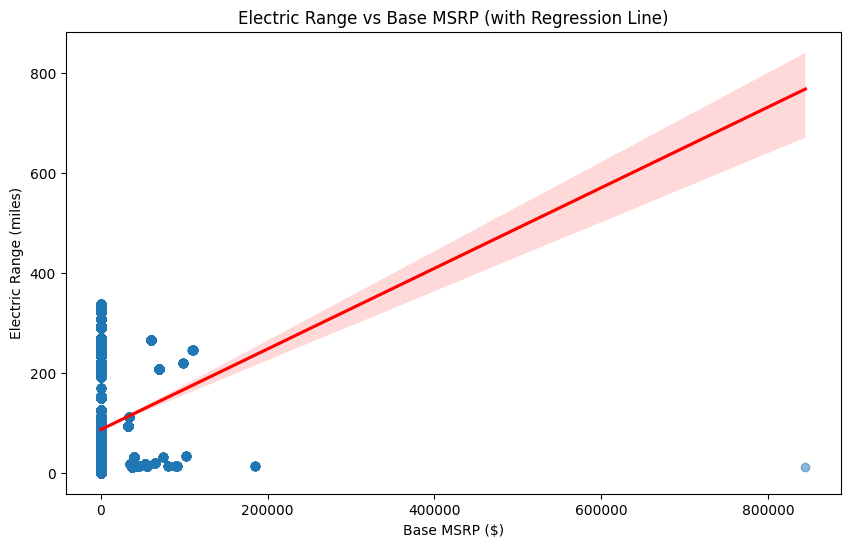

In [28]:
# Scatter plot with regression line for Electric Range vs Base MSRP
plt.figure(figsize=(10, 6))
sns.regplot(x='base_msrp', y='electric_range', data=df, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Electric Range vs Base MSRP (with Regression Line)')
plt.xlabel('Base MSRP ($)')
plt.ylabel('Electric Range (miles)')
plt.show()


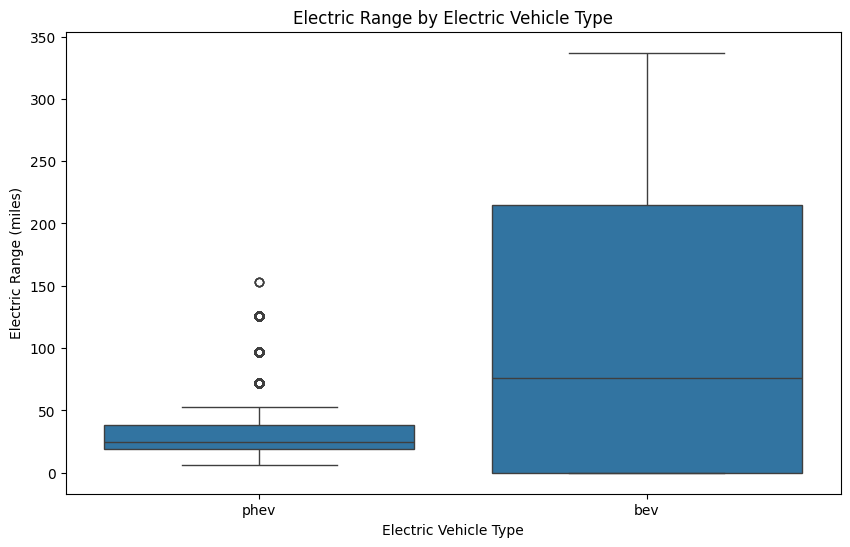

In [29]:
# Boxplot for Electric Range by Electric Vehicle Type
plt.figure(figsize=(10, 6))
sns.boxplot(x='ev_type', y='electric_range', data=df)
plt.title('Electric Range by Electric Vehicle Type')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Electric Range (miles)')
plt.show()


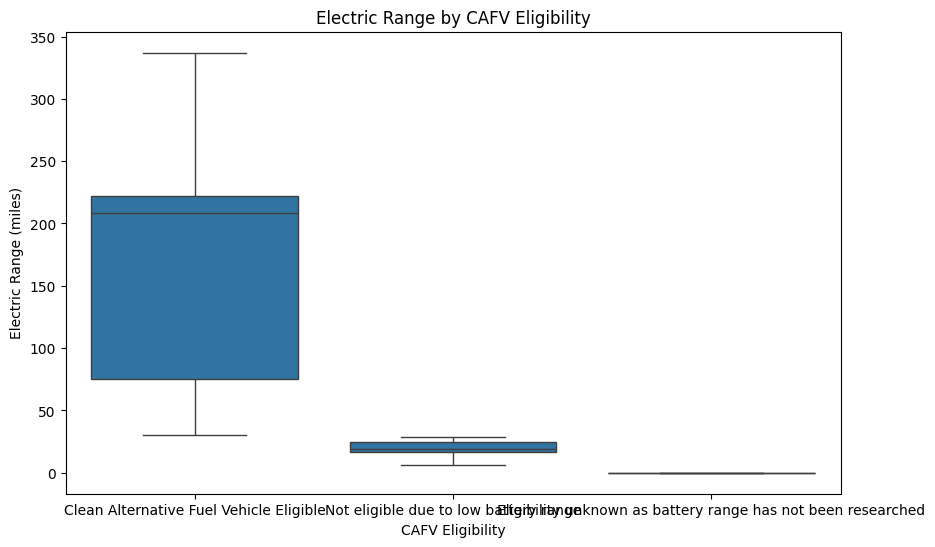

In [30]:
# Violin plot for Electric Range by CAFV Eligibility
plt.figure(figsize=(10, 6))
sns.boxplot(x='cafv_eligibility', y='electric_range', data=df)
plt.title('Electric Range by CAFV Eligibility')
plt.xlabel('CAFV Eligibility')
plt.ylabel('Electric Range (miles)')
plt.show()


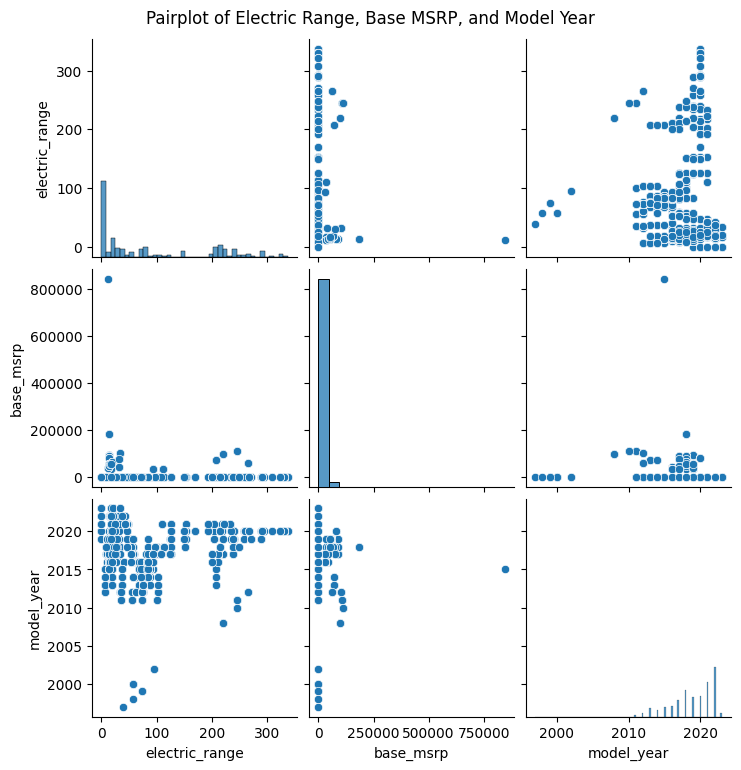

In [31]:
# Pairplot for selected variables (Electric Range, Base MSRP, Model Year)
sns.pairplot(df[['electric_range', 'base_msrp', 'model_year']])
plt.suptitle('Pairplot of Electric Range, Base MSRP, and Model Year', y=1.02)
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\2327368446.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='ev_type', y='base_msrp', data=df, ci=None)


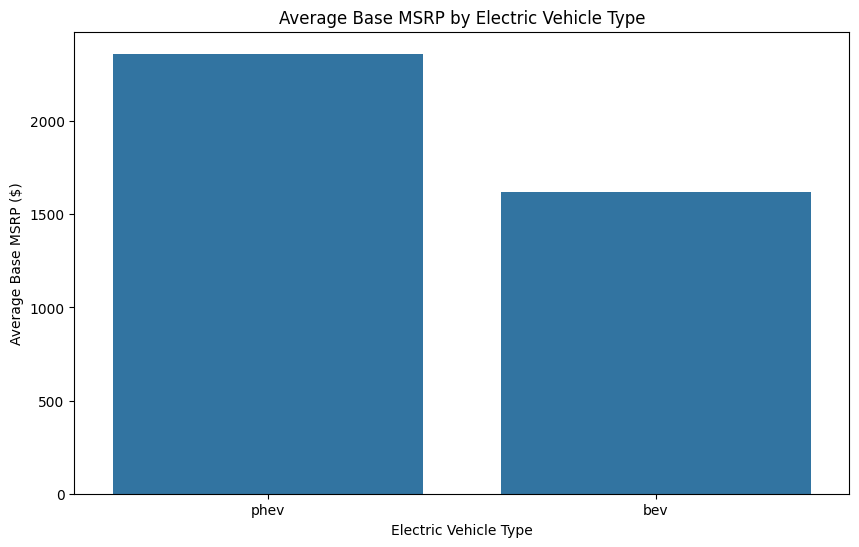

In [32]:
# Bar plot for average Base MSRP by Electric Vehicle Type
plt.figure(figsize=(10, 6))
sns.barplot(x='ev_type', y='base_msrp', data=df, ci=None)
plt.title('Average Base MSRP by Electric Vehicle Type')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Average Base MSRP ($)')
plt.show()


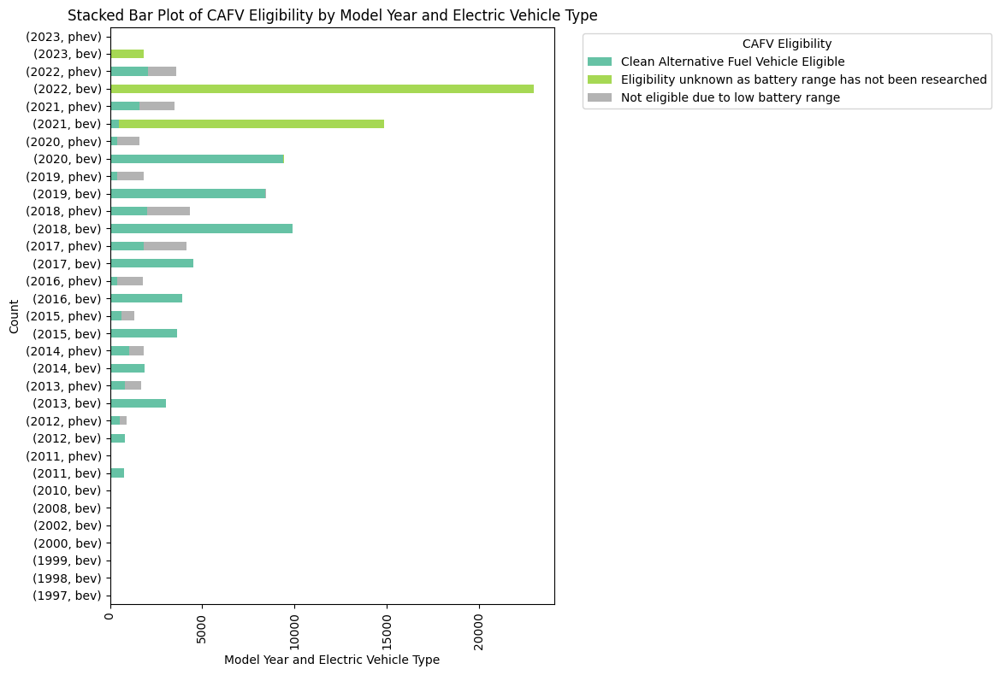

In [33]:
crosstab_multi = pd.crosstab([df['model_year'], df['ev_type']], df['cafv_eligibility'])

crosstab_multi.plot(kind='barh', stacked=True, figsize=(12, 8), colormap='Set2')
plt.title('Stacked Bar Plot of CAFV Eligibility by Model Year and Electric Vehicle Type')
plt.xlabel('Model Year and Electric Vehicle Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='CAFV Eligibility', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\1102252604.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='cafv_eligibility', y='model_year', palette='Set2')


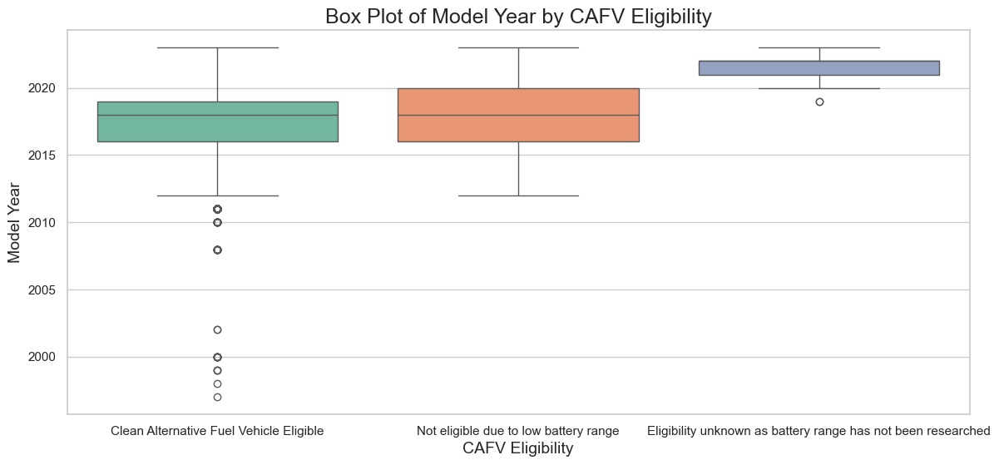

C:\Users\vaddi\AppData\Local\Temp\ipykernel_25212\1102252604.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='cafv_eligibility', y='model_year', palette='Set2', estimator='mean')


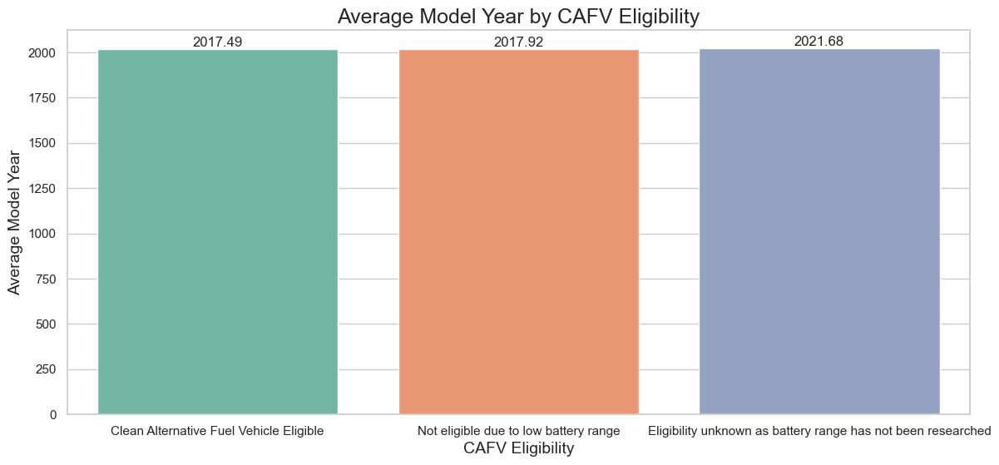

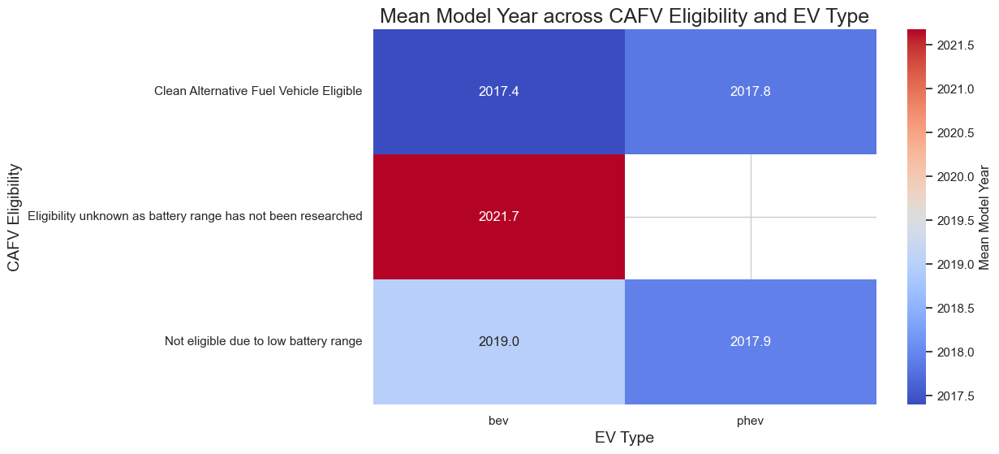

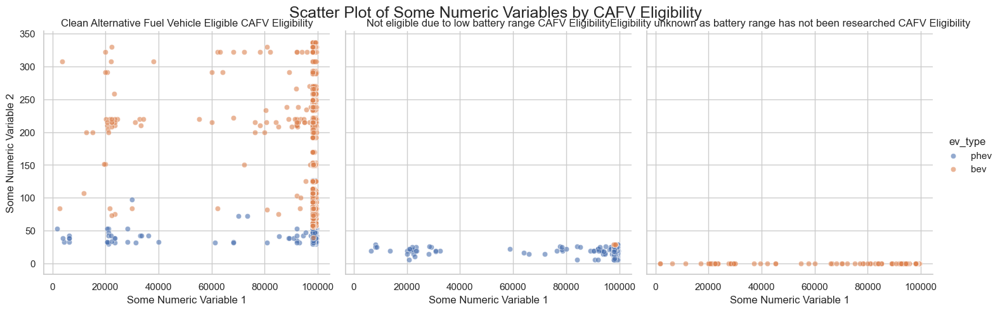

In [34]:
sns.set(style="whitegrid")

# Box Plot of Model Year by CAFV Eligibility
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x='cafv_eligibility', y='model_year', palette='Set2')
plt.title('Box Plot of Model Year by CAFV Eligibility', fontsize=18)
plt.xlabel('CAFV Eligibility', fontsize=14)
plt.ylabel('Model Year', fontsize=14)
plt.show()


# Bar Plot of Average Model Year by CAFV Eligibility
plt.figure(figsize=(14, 6))
sns.barplot(data=df, x='cafv_eligibility', y='model_year', palette='Set2', estimator='mean')
plt.title('Average Model Year by CAFV Eligibility', fontsize=18)
plt.xlabel('CAFV Eligibility', fontsize=14)
plt.ylabel('Average Model Year', fontsize=14)

for p in plt.gca().patches:
    plt.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', va='bottom', fontsize=12)

plt.show()

# Heatmap of Means for Model Year across CAFV Eligibility and EV Type
plt.figure(figsize=(10, 6))
mean_values = df.groupby(['cafv_eligibility', 'ev_type'])['model_year'].mean().unstack()
sns.heatmap(mean_values, annot=True, fmt='.1f', cmap='coolwarm', cbar_kws={'label': 'Mean Model Year'})
plt.title('Mean Model Year across CAFV Eligibility and EV Type', fontsize=18)
plt.xlabel('EV Type', fontsize=14)
plt.ylabel('CAFV Eligibility', fontsize=14)
plt.show()

# Facet Grid for scatter plots between numerical variables colored by CAFV Eligibility
g = sns.FacetGrid(df, col='cafv_eligibility', hue='ev_type', height=5)
g.map(sns.scatterplot, 'postal_code', 'electric_range', alpha=0.6)
g.add_legend()
g.set_axis_labels('Some Numeric Variable 1', 'Some Numeric Variable 2')
g.set_titles(col_template="{col_name} CAFV Eligibility")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Scatter Plot of Some Numeric Variables by CAFV Eligibility', fontsize=18)
plt.show()


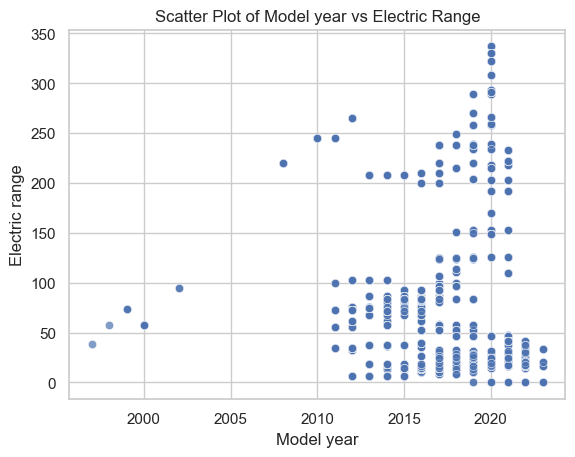

In [35]:
sns.scatterplot(x='model_year', y='electric_range', data=df, alpha=0.7)
plt.title('Scatter Plot of Model year vs Electric Range')
plt.xlabel('Model year')
plt.ylabel('Electric range')
plt.show()


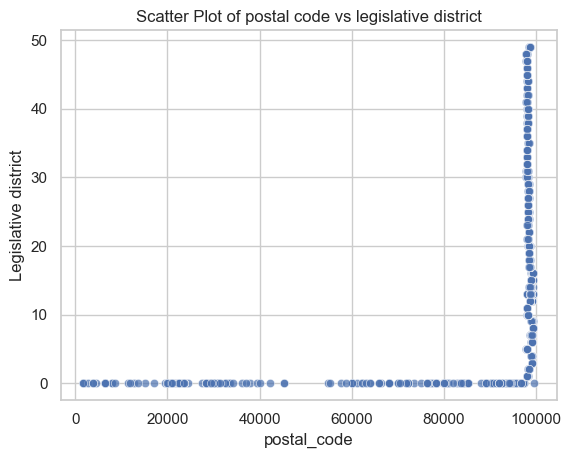

In [36]:
sns.scatterplot(x='postal_code', y='legislative_district', data=df, alpha=0.7)
plt.title('Scatter Plot of postal code vs legislative district')
plt.xlabel('postal_code')
plt.ylabel('Legislative district')
plt.show()


In [37]:
import bar_chart_race as bcr
import pandas as pd
df_grouped = df.groupby(['model_year', 'make', 'model']).size().reset_index(name='vehicle_count')
df_pivot = df_grouped.pivot_table(index='model_year', columns='make', values='vehicle_count', fill_value=0)


In [38]:
bcr.bar_chart_race(
    df=df_pivot,
    orientation="h",                    
    sort="desc",                       
    n_bars=10,                          
    steps_per_period=60,               
    period_length=3000,                
    title='Vehicle Sales Race by Make and Model Year',  
    bar_size=.95                        
)

C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:286: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(self.df_values.columns)
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:287: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:226: UserWarning: Some of your columns never make an appear

In [39]:
threshold_year = 0.90
df_pivot_filtered_years = df_pivot[df_pivot.apply(lambda row: (row == 0).mean() < threshold_year, axis=1)]
threshold_company = 0.90
df_pivot_filtered = df_pivot_filtered_years.loc[:, df_pivot_filtered_years.apply(lambda col: (col == 0).mean() < threshold_company, axis=0)]
df_pivot_filtered

make,AUDI,AZURE DYNAMICS,BENTLEY,BMW,CADILLAC,CHEVROLET,CHRYSLER,FIAT,FORD,HONDA,...,MITSUBISHI,NISSAN,POLESTAR,PORSCHE,SMART,SUBARU,TESLA,TOYOTA,VOLKSWAGEN,VOLVO
model_year,,,,,,,,,,,,,,,,,,,,,
2011,0.000000,4.0,0.0,0.000000,0.0,71.0,0.0,0.0,0.000000,0.0,...,0.0,755.0,0.0,0.000000,0.0,0.0,7.000000,0.0,0.0,0.000000
2012,0.000000,3.0,0.0,0.000000,0.0,496.0,0.0,0.0,15.000000,0.0,...,42.0,610.0,0.0,0.000000,0.0,0.0,134.000000,192.5,0.0,0.000000
2013,0.000000,0.0,0.0,0.000000,0.0,818.0,0.0,106.0,220.666667,0.0,...,0.0,1966.0,0.0,0.000000,29.0,0.0,814.000000,148.0,0.0,0.000000
2014,0.000000,0.0,0.0,228.500000,58.0,362.0,0.0,97.0,209.333333,9.0,...,10.0,694.0,0.0,8.000000,71.0,0.0,683.000000,107.5,0.0,0.000000
2015,0.000000,0.0,0.0,201.500000,0.0,233.5,0.0,242.0,185.333333,0.0,...,0.0,1839.0,0.0,11.000000,52.0,0.0,1089.000000,89.0,124.0,0.000000
2016,214.000000,0.0,0.0,95.750000,18.0,154.5,0.0,148.0,259.333333,0.0,...,12.0,1208.0,0.0,39.000000,31.0,0.0,819.500000,0.0,319.0,112.000000
2017,187.000000,0.0,0.0,138.400000,15.0,1372.0,94.0,167.0,219.666667,0.0,...,1.0,934.0,0.0,71.000000,34.0,0.0,559.666667,899.0,52.0,115.000000
2018,174.000000,0.0,0.0,142.000000,17.0,563.0,554.0,53.0,85.000000,614.0,...,183.0,1232.0,0.0,39.000000,47.0,0.0,2639.666667,659.0,39.0,75.333333
2019,392.000000,0.0,0.0,69.750000,0.0,483.0,119.0,9.0,136.000000,73.0,...,146.0,1409.0,0.0,31.000000,9.0,58.0,1527.666667,190.0,495.0,47.500000


In [40]:
bcr.bar_chart_race(
    df=df_pivot_filtered,
    orientation="h",                    
    sort="desc",                       
    n_bars=12,                          
    steps_per_period=45,               
    period_length=3000,                
    title='Vehicle Sales Race by Make and Model Year',  
    bar_size=.95                        
)


C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:286: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(self.df_values.columns)
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:287: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))
C:\Users\vaddi\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:226: UserWarning: Some of your columns never make an appear

C:\ProgramData\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


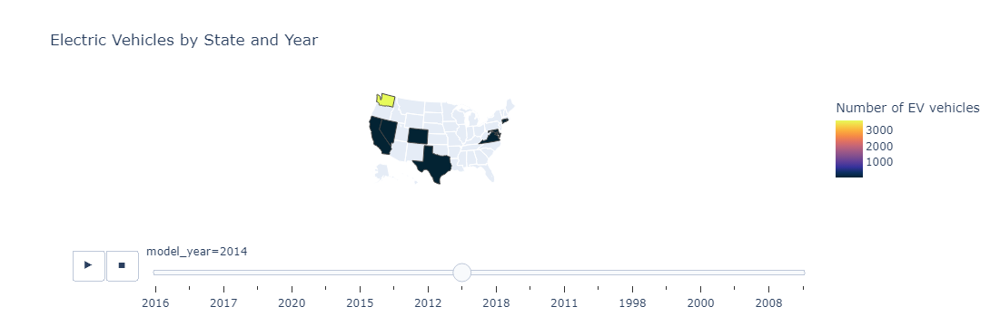

In [41]:
import plotly.express as px

# Group data by State and Model Year, calculating the number of EVs and average range per state
state_df = df.groupby(['state', 'model_year']).agg(
    ev_count=('vin', 'count'),
    avg_range=('electric_range', 'mean')
).reset_index()

# Create the choropleth plot
fig = px.choropleth(state_df,
                    locations='state',
                    locationmode='USA-states',
                    color='ev_count',
                    hover_name='state',
                    hover_data=['avg_range'],
                    animation_frame='model_year',
                    color_continuous_scale='thermal',
                    scope='usa',
                    labels={'ev_count': 'Number of EV vehicles'},
                    title='Electric Vehicles by State and Year')

# Show the plot
fig.show()

